# CV Project


## Import Statements

In [4]:
import os
import glob
import random
import numpy as np
import pandas as pd
import cv2
import torch
from tqdm import tqdm
import shutil
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, ImageDraw
from ultralytics import YOLO
from matplotlib.widgets import Button
# from realesrgan import RealESRGAN


## Helper Functions

### Data Preparation

In [2]:
# Function to remove empty labels and convert annotations to YOLO bbox format
def preprocess_data(dataset_path):

    # Function to convert polygon (normalized) to YOLO bbox format
    def polygon_to_yolo_bbox(coords):
        x_coords = coords[::2]
        y_coords = coords[1::2]
        x_min = min(x_coords)
        y_min = min(y_coords)
        x_max = max(x_coords)
        y_max = max(y_coords)
        x_center = (x_min + x_max) / 2
        y_center = (y_min + y_max) / 2
        width = x_max - x_min
        height = y_max - y_min
        return [x_center, y_center, width, height]

    base_folders = [os.path.join(dataset_path, 'train'), os.path.join(dataset_path, 'test'), os.path.join(dataset_path, 'valid')]

    for folder in base_folders:
        images_path = os.path.join(folder, "images")
        labels_path = os.path.join(folder, "labels")
        label_files = glob.glob(os.path.join(labels_path, "*.txt"))

        for label_file in label_files:
            image_file = os.path.join(images_path, os.path.basename(label_file).replace(".txt", ".jpg"))
            if not os.path.exists(image_file):
                continue  # Skip if corresponding image doesn't exist

            with open(label_file, "r") as f:
                lines = f.readlines()

            if not lines:
                os.remove(label_file)
                os.remove(image_file)
                continue

            new_lines = []
            for line in lines:
                parts = line.strip().split()
                if len(parts) < 9:
                    continue  # Skip malformed lines
                class_id = parts[0]
                coords = list(map(float, parts[1:]))
                bbox = polygon_to_yolo_bbox(coords)
                new_line = f"{class_id} {' '.join(f'{x:.6f}' for x in bbox)}"
                new_lines.append(new_line)

            with open(label_file, "w") as f:
                f.write("\n".join(new_lines) + "\n")

    print("Preprocessing complete. Empty labels removed and annotations converted to YOLO format.")

def create_low_res_dataset(dataset_hr_path='dataset_hr', dataset_lr_path='dataset_lr',
                           downscale_factor=2, blur_kernel_size=(5, 5),
                           blur_sigma=1.0, noise_level=5):

    def degrade_image(img):
        img_array = np.array(img)
        h, w, c = img_array.shape

        # Downscale
        new_h, new_w = h // downscale_factor, w // downscale_factor
        img_small = cv2.resize(img_array, (new_w, new_h), interpolation=cv2.INTER_CUBIC)

        # Blur
        img_blur = cv2.GaussianBlur(img_small, blur_kernel_size, blur_sigma)

        # Add noise
        noise = np.random.normal(0, noise_level, img_blur.shape).astype(np.float32)
        img_float = img_blur.astype(np.float32)
        img_noisy = np.clip(img_float + noise, 0, 255).astype(np.uint8)

        return Image.fromarray(img_noisy)

    # Process each split
    for split in ['train', 'valid', 'test']:
        hr_img_dir = os.path.join(dataset_hr_path, split, 'images')
        hr_lbl_dir = os.path.join(dataset_hr_path, split, 'labels')

        lr_img_dir = os.path.join(dataset_lr_path, split, 'images')
        lr_lbl_dir = os.path.join(dataset_lr_path, split, 'labels')

        os.makedirs(lr_img_dir, exist_ok=True)
        os.makedirs(lr_lbl_dir, exist_ok=True)

        # Process images
        img_files = glob.glob(os.path.join(hr_img_dir, '*.*'))
        for img_path in tqdm(img_files, desc=f"Processing {split} images"):
            try:
                img = Image.open(img_path).convert('RGB')
                degraded_img = degrade_image(img)
                out_path = os.path.join(lr_img_dir, os.path.basename(img_path))
                degraded_img.save(out_path)
            except Exception as e:
                print(f"Error processing image {img_path}: {e}")

        # Copy labels (YOLO format is normalized, so it doesn't need change)
        label_files = glob.glob(os.path.join(hr_lbl_dir, '*.txt'))
        for lbl_path in label_files:
            out_lbl_path = os.path.join(lr_lbl_dir, os.path.basename(lbl_path))
            shutil.copy(lbl_path, out_lbl_path)

    print(f"Low-resolution dataset created at: {dataset_lr_path}")

# def create_sr_dataset(dataset_lr_path='dataset_lr', dataset_sr_path='dataset_sr', target_size=(640, 640)):
#     # Initialize Real-ESRGAN with x2 model
#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#     model = RealESRGAN(device, scale=2)
#     model.load_weights('RealESRGAN_x2plus.pth')  # Make sure the model file is downloaded!

#     for split in ['train', 'valid', 'test']:
#         lr_img_dir = os.path.join(dataset_lr_path, split, 'images')
#         lr_lbl_dir = os.path.join(dataset_lr_path, split, 'labels')

#         sr_img_dir = os.path.join(dataset_sr_path, split, 'images')
#         sr_lbl_dir = os.path.join(dataset_sr_path, split, 'labels')

#         os.makedirs(sr_img_dir, exist_ok=True)
#         os.makedirs(sr_lbl_dir, exist_ok=True)

#         # Process images
#         img_files = glob.glob(os.path.join(lr_img_dir, '*.*'))
#         for img_path in tqdm(img_files, desc=f"Upscaling {split} images"):
#             try:
#                 img = Image.open(img_path).convert('RGB')
#                 sr_img = model.predict(img)
                
#                 # Resize to 640x640 if needed
#                 sr_img = sr_img.resize(target_size, Image.BICUBIC)

#                 sr_img.save(os.path.join(sr_img_dir, os.path.basename(img_path)))
#             except Exception as e:
#                 print(f"Error upscaling {img_path}: {e}")

#         # Copy labels (no changes needed)
#         for lbl_path in glob.glob(os.path.join(lr_lbl_dir, '*.txt')):
#             shutil.copy(lbl_path, os.path.join(sr_lbl_dir, os.path.basename(lbl_path)))

#     print(f"Super-resolution dataset created at: {dataset_sr_path}")


# Function to save ground truth images with bounding boxes
def save_gt_images_with_bboxes(dataset_path, split, output_path):

    # Set paths
    test_images_dir = os.path.join(dataset_path, split, "images")
    test_labels_dir = os.path.join(dataset_path, split, "labels")
    os.makedirs(output_path, exist_ok=True)

    # Get all test images
    test_images = glob.glob(os.path.join(test_images_dir, "*.jpg")) + \
                glob.glob(os.path.join(test_images_dir, "*.jpeg")) + \
                glob.glob(os.path.join(test_images_dir, "*.png"))

    for img_path in test_images:
        img = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        img_name = os.path.basename(img_path)
        label_path = os.path.join(test_labels_dir, os.path.splitext(img_name)[0] + ".txt")
        w, h = img.size

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    # YOLO format: class x_center y_center width height
                    _, x, y, bw, bh = map(float, parts[:5])
                    # Convert to pixel coordinates
                    x1 = int((x - bw / 2) * w)
                    y1 = int((y - bh / 2) * h)
                    x2 = int((x + bw / 2) * w)
                    y2 = int((y + bh / 2) * h)
                    draw.rectangle([x1, y1, x2, y2], outline=(255, 0, 0), width=5)
        img.save(os.path.join(output_path, img_name))

    print(f"Saved ground truth images with bounding boxes to {output_path}")



### Training and Evaluation

In [3]:
def train_model(data, name, project, imgsz=640, epochs=50, optimizer="Adam", lr="0.001", batch="16", freeze=0, conf=0.25, iou=0.7):

    # Load pre-trained model
    model = YOLO('yolo11n.pt')

    # Train model
    model.train(
        data=data,  
        epochs=epochs,
        batch=batch,
        imgsz=imgsz,
        optimizer=optimizer,
        lr0=lr,
        project=project,
        name=name,
        device=0,
        freeze=freeze,
        conf=conf,
        iou=iou,
    )

    print(f"Training completed for model: {name}")

    return model

def evaluate_model(data, name, model_dir, project, split, conf=0.25, iou=0.7):

    model_path = os.path.join(model_dir, name, 'weights', 'best.pt')
    model = YOLO(model_path)

    metrics = model.val(
        data=data,
        project=project,
        name=name,
        split=split,
        conf=conf,
        iou=iou,
    )
    return metrics

def predict_model(name, model_dir, dataset_name, project, split, conf=0.25, iou=0.7):
    model_path = os.path.join(model_dir, name, 'weights', 'best.pt')
    model = YOLO(model_path)

    results = model.predict(
        source=f'{dataset_name}/{split}/images',
        save=True,
        save_txt=True,
        project=project,
        name=name,
        conf=conf,
        iou=iou,
        verbose=False,
    )
    return results



### Visualization

In [ ]:
def show_image(title, image_path):
    img = mpimg.imread(image_path)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{title}")
    plt.show()

def show_loss_plots(model_name, dataset_name, model_folder):
    results_path = os.path.join(model_folder, model_name, 'results.png')
    if os.path.exists(results_path):
        show_image(f"Training Results: {dataset_name} | {model_name}", results_path)
    else:
        print(f"results.png not found for model '{model_name}' at {results_path}")

## Dataset Preparation

In [ ]:
preprocess_data('dataset_hr')

In [ ]:
create_low_res_dataset('dataset_hr', 'dataset_lr', downscale_factor=2, blur_kernel_size=(5, 5), blur_sigma=1.0, noise_level=5)

In [5]:
save_gt_images_with_bboxes('dataset_hr', 'test', 'gt_images/dataset_hr/test')

Saved ground truth images with bounding boxes to gt_images/dataset_hr/test


In [6]:
save_gt_images_with_bboxes('dataset_lr', 'test', 'gt_images/dataset_lr/test')

Saved ground truth images with bounding boxes to gt_images/dataset_lr/test


In [7]:
save_gt_images_with_bboxes('dataset_sr', 'test', 'gt_images/dataset_sr/test')

Saved ground truth images with bounding boxes to gt_images/dataset_sr/test


## Train and Evaluate

### HR

#### Train

In [ ]:
model = train_model(
    data='dataset_hr/data.yaml',
    name='baseline_yolo11n',
    project='hr_yolo11n_models',
    imgsz=640,
    epochs=50,
    optimizer="Adam",
    lr=0.001,
    batch=16,
    freeze=0,
    conf=0.25,
    iou=0.7
)

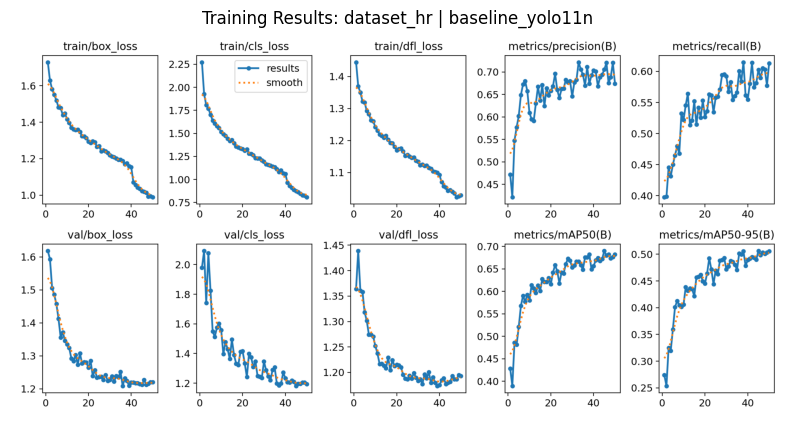

In [11]:
show_loss_plots('baseline_yolo11n', 'dataset_hr', 'hr_yolo11n_models')

#### Evaluate

In [12]:
metrics = evaluate_model(
    data='dataset_hr/data.yaml',
    name='baseline_yolo11n',
    model_dir='hr_yolo11n_models',
    project='hr_yolo11n_test_metrics',
    split='test',
    conf=0.25,
    iou=0.7
)

Ultralytics 8.3.131  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 897.6221.2 MB/s, size: 160.9 KB)


val: Scanning C:\Users\Kayra\Desktop\cv_project\dataset_hr\test\labels.cache... 322 images, 0 backgrounds, 0 corrupt: 100%|██████████| 322/322 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.81it/s]


                   all        322        844       0.75      0.547      0.671      0.499
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to hr_yolo11n_test_metrics\baseline_yolo11n


#### Predictions

In [13]:
predictions = predict_model(
    name='baseline_yolo11n',
    model_dir='hr_yolo11n_models',
    dataset_name='dataset_hr',
    project='hr_yolo11n_test_predictions',
    split='test',
    conf=0.25,
    iou=0.7
)

Results saved to hr_yolo11n_test_predictions\baseline_yolo11n
298 labels saved to hr_yolo11n_test_predictions\baseline_yolo11n\labels


### LR

#### Train

In [ ]:
model = train_model(
    data='dataset_lr/data.yaml',
    name='baseline_yolo11n',
    project='lr_yolo11n_models',
    imgsz=320,
    epochs=50,
    optimizer="Adam",
    lr=0.001,
    batch=16,
    freeze=0,
    conf=0.25,
    iou=0.7
)

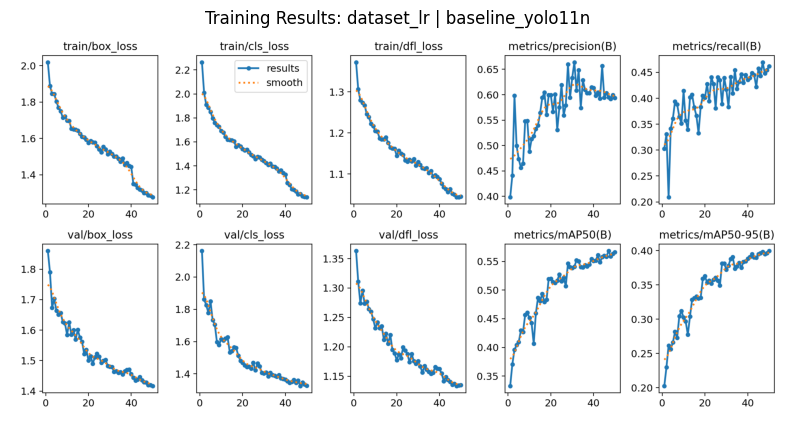

In [14]:
show_loss_plots('baseline_yolo11n', 'dataset_lr', 'lr_yolo11n_models')

#### Evaluate

In [15]:
metrics = evaluate_model(
    data='dataset_lr/data.yaml',
    name='baseline_yolo11n',
    model_dir='lr_yolo11n_models',
    project='lr_yolo11n_test_metrics',
    split='test',
    conf=0.25,
    iou=0.7
)

Ultralytics 8.3.131  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 59.112.3 MB/s, size: 23.3 KB)


val: Scanning C:\Users\Kayra\Desktop\cv_project\dataset_lr\test\labels... 322 images, 0 backgrounds, 0 corrupt: 100%|██████████| 322/322 [00:00<00:00, 1713.99it/s]

val: New cache created: C:\Users\Kayra\Desktop\cv_project\dataset_lr\test\labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  6.86it/s]


                   all        322        844      0.587      0.416      0.526      0.374
Speed: 0.2ms preprocess, 3.2ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to lr_yolo11n_test_metrics\baseline_yolo11n


#### Predictions

In [16]:
predictions = predict_model(
    name='baseline_yolo11n',
    model_dir='lr_yolo11n_models',
    dataset_name='dataset_lr',
    project='lr_yolo11n_test_predictions',
    split='test',
    conf=0.25,
    iou=0.7
)

Results saved to lr_yolo11n_test_predictions\baseline_yolo11n
264 labels saved to lr_yolo11n_test_predictions\baseline_yolo11n\labels


### SR

#### Train

In [ ]:
model = train_model(
    data='dataset_sr/data.yaml',
    name='baseline_yolo11n',
    project='sr_yolo11n_models',
    imgsz=640,
    epochs=50,
    optimizer="Adam",
    lr=0.001,
    batch=16,
    freeze=0,
    conf=0.25,
    iou=0.7
)

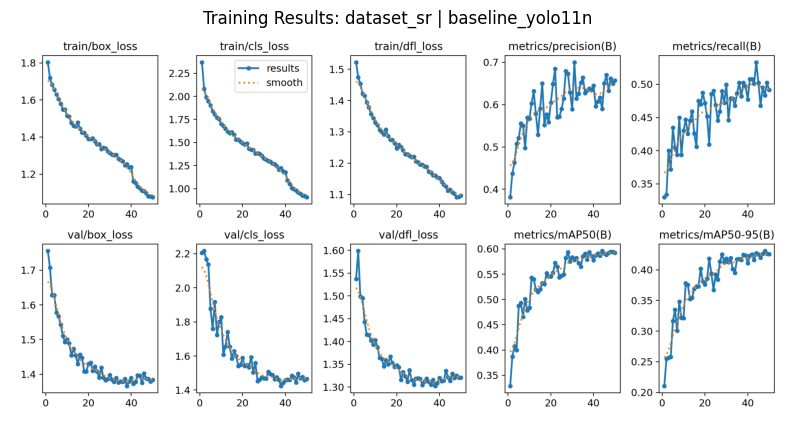

In [17]:
show_loss_plots('baseline_yolo11n', 'dataset_sr', 'sr_yolo11n_models')

#### Evaluate

In [20]:
metrics = evaluate_model(
    data='dataset_sr/data.yaml',
    name='baseline_yolo11n',
    model_dir='sr_yolo11n_models',
    project='sr_yolo11n_test_metrics',
    split='test',
    conf=0.25,
    iou=0.7
)

Ultralytics 8.3.131  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.20.0 ms, read: 918.5253.9 MB/s, size: 228.1 KB)


val: Scanning C:\Users\Kayra\Desktop\cv_project\dataset_sr\test\labels... 322 images, 0 backgrounds, 0 corrupt: 100%|██████████| 322/322 [00:00<00:00, 1101.42it/s]

val: New cache created: C:\Users\Kayra\Desktop\cv_project\dataset_sr\test\labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.84it/s]


                   all        322        844       0.71      0.424       0.58      0.416
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to sr_yolo11n_test_metrics\baseline_yolo11n


#### Predictions

In [21]:
predictions = predict_model(
    name='baseline_yolo11n',
    model_dir='sr_yolo11n_models',
    dataset_name='dataset_sr',
    project='sr_yolo11n_test_predictions',
    split='test',
    conf=0.25,
    iou=0.7
)

Results saved to sr_yolo11n_test_predictions\baseline_yolo11n
280 labels saved to sr_yolo11n_test_predictions\baseline_yolo11n\labels


## Visualize the Bounding Box Predictions

In [ ]:
def load_labels(label_path):
    boxes = []
    if not os.path.exists(label_path):
        return boxes
    with open(label_path, 'r') as f:
        for line in f.readlines():
            cls, x, y, w, h = map(float, line.strip().split())
            boxes.append([cls, x, y, w, h])
    return boxes


def yolo_to_box(box, img_w, img_h):
    _, x, y, w, h = box
    x1 = int((x - w / 2) * img_w)
    y1 = int((y - h / 2) * img_h)
    x2 = int((x + w / 2) * img_w)
    y2 = int((y + h / 2) * img_h)
    return [x1, y1, x2, y2]


def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = max(0, box1[2] - box1[0]) * max(0, box1[3] - box1[1])
    box2_area = max(0, box2[2] - box2[0]) * max(0, box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    if union_area == 0:
        return 0
    return inter_area / union_area


def show_image_with_boxes(img_path, gt_boxes, pred_boxes):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    tp = 0
    fp = 0
    fn = 0


    gt_pixels = [yolo_to_box(b, w, h) for b in gt_boxes]
    pred_pixels = [yolo_to_box(b, w, h) for b in pred_boxes]

    for box in pred_pixels:
        matched = any(iou(box, gt) > 0.5 for gt in gt_pixels)
        if matched:
            tp += 1
        else:
            fp += 1
        color = (0, 255, 0) if matched else (255, 0, 0)
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), color, 2)

    for box in gt_pixels:
        matched = any(iou(box, pred) > 0.5 for pred in pred_pixels)
        if not matched:
            fn += 1
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), (0, 0, 255), 2)
    
    print(f"TP: {tp}, FP: {fp}, FN: {fn}")

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()
    
def show_prediction(img_name, pred_folder, gt_image_folder, gt_label_folder):
    label_file = img_name.replace(".jpg", ".txt")
    pred_path = os.path.join(pred_folder, label_file)
    gt_path = os.path.join(gt_label_folder, label_file)
    img_path = os.path.join(gt_image_folder, img_name)

    pred_boxes = load_labels(pred_path)
    gt_boxes = load_labels(gt_path)

    match_img = (img_path, gt_boxes, pred_boxes)

    show_image_with_boxes(*match_img)

def show_all_predictions(image_name, model_name="baseline_yolo11n"):
    # Define dataset configurations
    datasets = {
        "HR": {
            "pred_folder": f"hr_yolo11n_test_predictions/{model_name}/labels",
            "img_folder": "dataset_hr/test/images",
            "label_folder": "dataset_hr/test/labels"
        },
        "LR": {
            "pred_folder": f"lr_yolo11n_test_predictions/{model_name}/labels",
            "img_folder": "dataset_lr/test/images",
            "label_folder": "dataset_lr/test/labels"
        },
        "SR": {
            "pred_folder": f"sr_yolo11n_test_predictions/{model_name}/labels",
            "img_folder": "dataset_sr/test/images",
            "label_folder": "dataset_sr/test/labels"
        }
    }

    for (key, config) in datasets.items():
        print("Showing predictions for dataset:", key)
        print("Image:", image_name)
        show_prediction(
            image_name,
            config["pred_folder"],
            config["img_folder"],
            config["label_folder"]
        )
    

### SR improves TP of LR

Showing predictions for dataset: HR
Image: IMG_7018_JPG_jpg.rf.aeed315ae8f6612314be2fbf52569279.jpg
TP: 3, FP: 1, FN: 0


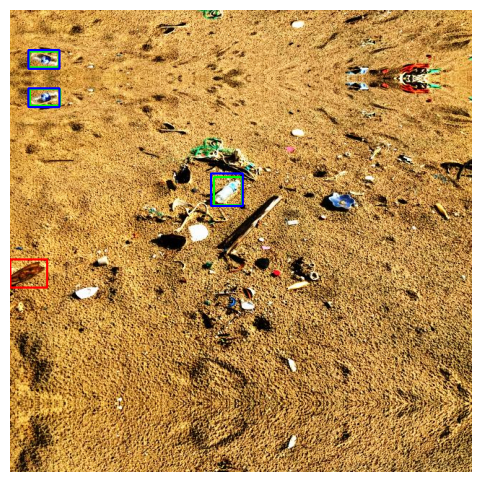

Showing predictions for dataset: LR
Image: IMG_7018_JPG_jpg.rf.aeed315ae8f6612314be2fbf52569279.jpg
TP: 1, FP: 0, FN: 2


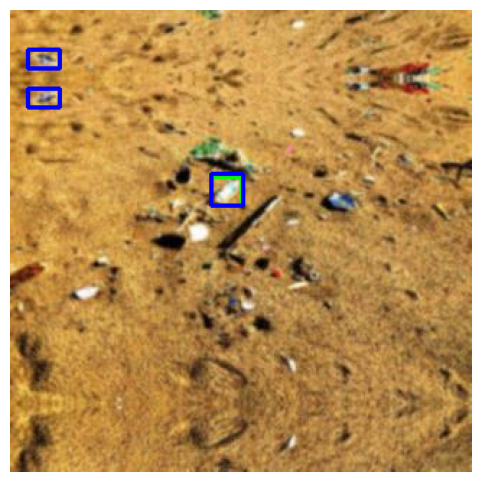

Showing predictions for dataset: SR
Image: IMG_7018_JPG_jpg.rf.aeed315ae8f6612314be2fbf52569279.jpg
TP: 3, FP: 2, FN: 0


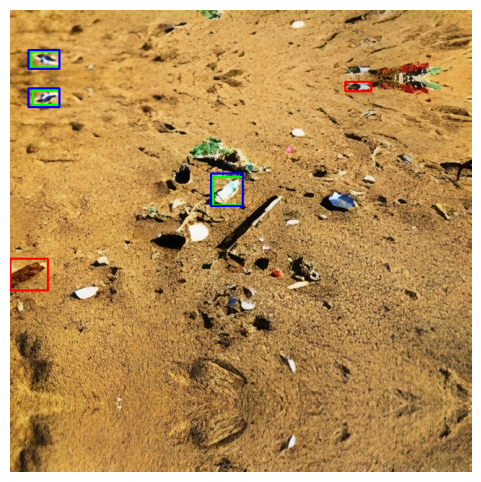

In [ ]:
show_all_predictions("IMG_7018_JPG_jpg.rf.aeed315ae8f6612314be2fbf52569279.jpg", model_name="baseline_yolo11n")

### SR improves FP of LR

Showing predictions for dataset: HR
Image: IMG_7150_JPG_jpg.rf.db68efc09d44e5bc48af19467d035fdb.jpg
TP: 2, FP: 0, FN: 0


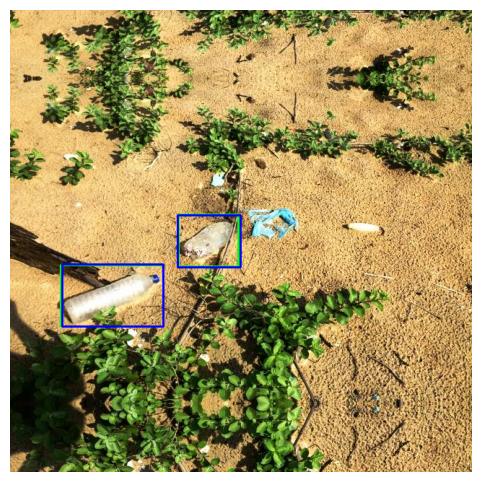

Showing predictions for dataset: LR
Image: IMG_7150_JPG_jpg.rf.db68efc09d44e5bc48af19467d035fdb.jpg
TP: 2, FP: 1, FN: 0


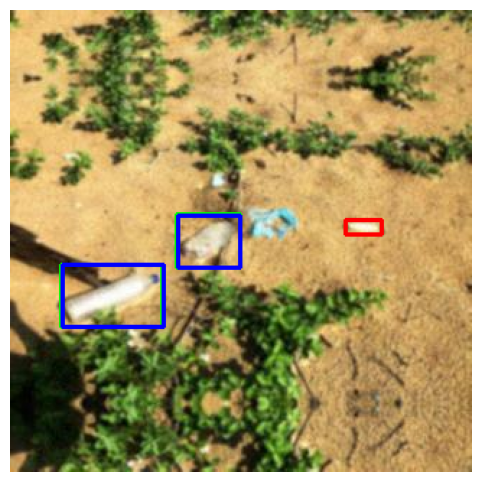

Showing predictions for dataset: SR
Image: IMG_7150_JPG_jpg.rf.db68efc09d44e5bc48af19467d035fdb.jpg
TP: 2, FP: 0, FN: 0


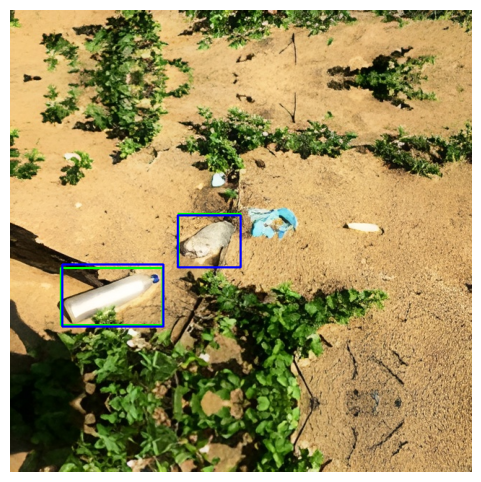

In [ ]:
show_all_predictions("IMG_7150_JPG_jpg.rf.db68efc09d44e5bc48af19467d035fdb.jpg", model_name="baseline_yolo11n")

### SR improves TP of HR

Showing predictions for dataset: HR
Image: IMG_7746_JPG_jpg.rf.d2de6303356127deb282d6f70ae44fcf.jpg
TP: 2, FP: 0, FN: 1


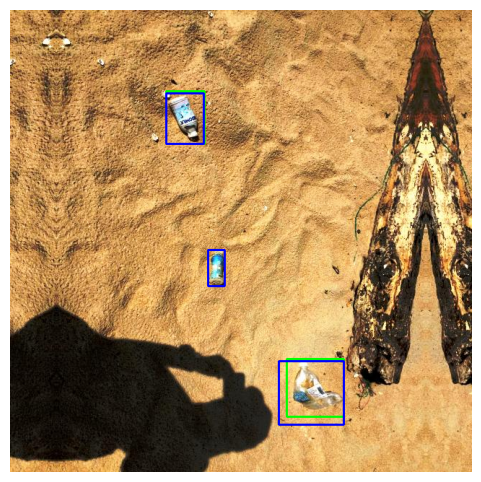

Showing predictions for dataset: LR
Image: IMG_7746_JPG_jpg.rf.d2de6303356127deb282d6f70ae44fcf.jpg
TP: 2, FP: 0, FN: 1


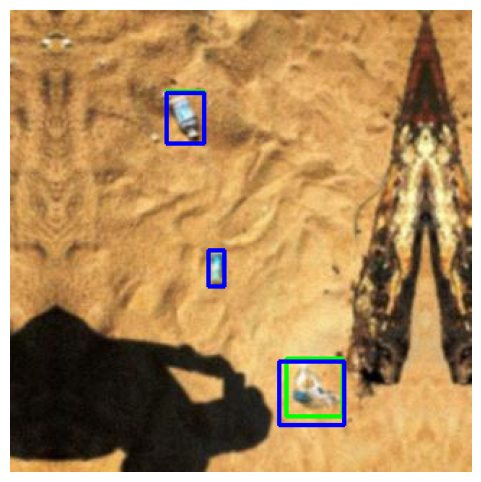

Showing predictions for dataset: SR
Image: IMG_7746_JPG_jpg.rf.d2de6303356127deb282d6f70ae44fcf.jpg
TP: 3, FP: 0, FN: 0


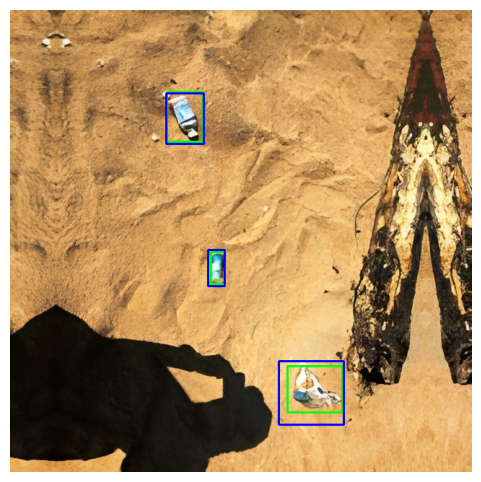

In [ ]:
show_all_predictions("IMG_7746_JPG_jpg.rf.d2de6303356127deb282d6f70ae44fcf.jpg", model_name="baseline_yolo11n")

### SR Low Recall Example

Showing predictions for dataset: HR
Image: 20240227_111457_jpg.rf.b23e5c84f36486dedec7f8507bdb18c9.jpg
TP: 2, FP: 0, FN: 0


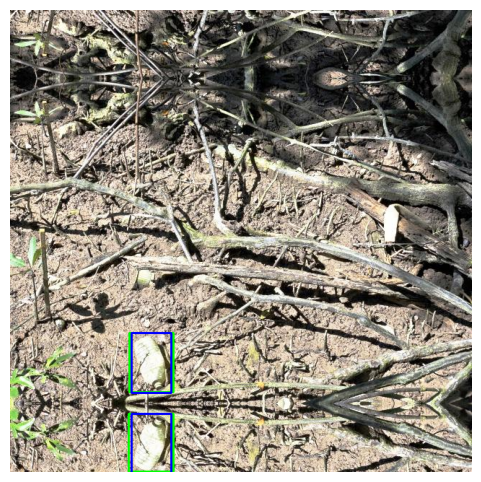

Showing predictions for dataset: LR
Image: 20240227_111457_jpg.rf.b23e5c84f36486dedec7f8507bdb18c9.jpg
TP: 2, FP: 1, FN: 0


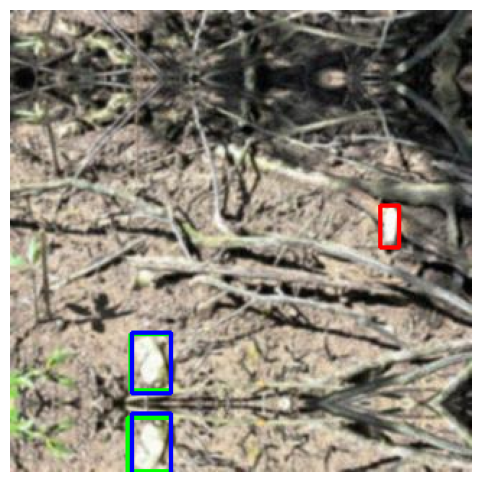

Showing predictions for dataset: SR
Image: 20240227_111457_jpg.rf.b23e5c84f36486dedec7f8507bdb18c9.jpg
TP: 1, FP: 0, FN: 1


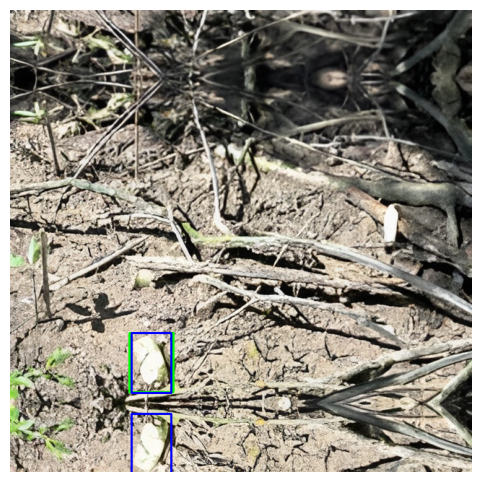

In [68]:
show_all_predictions("20240227_111457_jpg.rf.b23e5c84f36486dedec7f8507bdb18c9.jpg", model_name="baseline_yolo11n")

Showing predictions for dataset: HR
Image: IMG_7067_JPG_jpg.rf.294c1573c96669dce8f6a20160fb177d.jpg
TP: 10, FP: 0, FN: 1


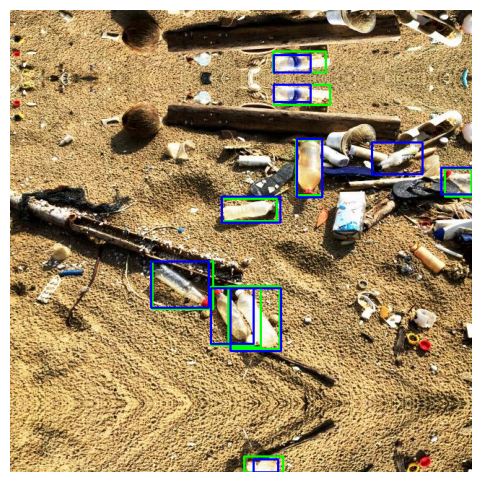

Showing predictions for dataset: LR
Image: IMG_7067_JPG_jpg.rf.294c1573c96669dce8f6a20160fb177d.jpg
TP: 6, FP: 2, FN: 4


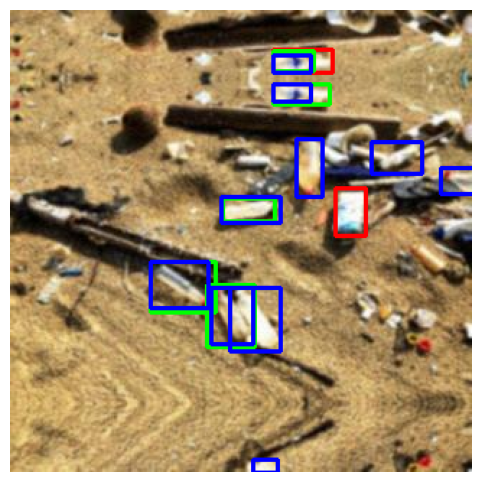

Showing predictions for dataset: SR
Image: IMG_7067_JPG_jpg.rf.294c1573c96669dce8f6a20160fb177d.jpg
TP: 5, FP: 3, FN: 5


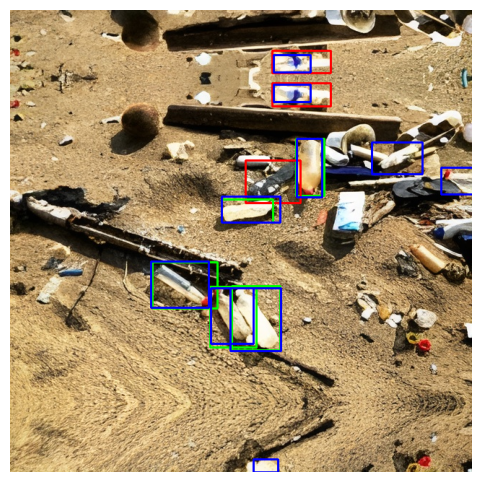

In [67]:
show_all_predictions("IMG_7067_JPG_jpg.rf.294c1573c96669dce8f6a20160fb177d.jpg", model_name="baseline_yolo11n")

### Incorrect Annotations

#### One Bottle as Two

TP: 2, FP: 1, FN: 5


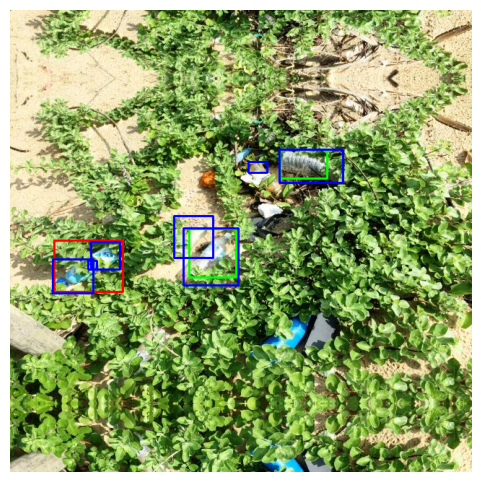

In [33]:
show_prediction(
    "IMG_7006_JPG_jpg.rf.c181eb68c6552e56820820d106d9bc38.jpg",
    "hr_yolo11n_test_predictions/baseline_yolo11n/labels",
    "dataset_hr/test/images",
    "dataset_hr/test/labels"
)

TP: 1, FP: 1, FN: 2


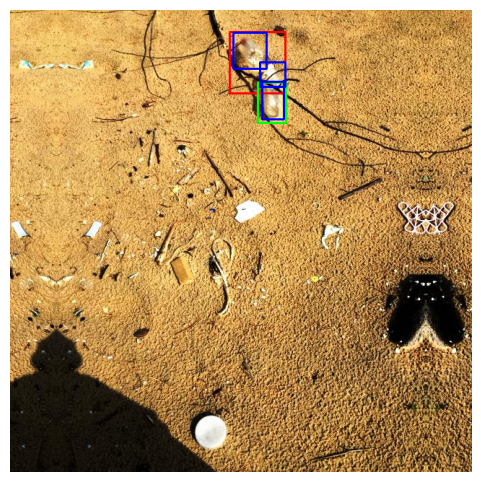

In [38]:
show_prediction(
    "IMG_7112_JPG_jpg.rf.e9f8b226f6e5d232fcec2903d607cf85.jpg",
    "hr_yolo11n_test_predictions/baseline_yolo11n/labels",
    "dataset_hr/test/images",
    "dataset_hr/test/labels"
)

#### Bounding Box Mismatch

TP: 4, FP: 1, FN: 1


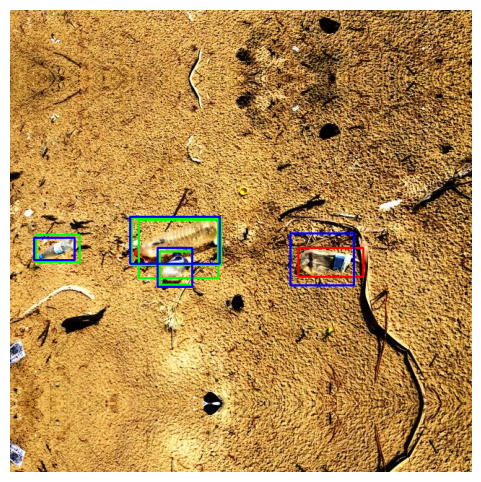

In [42]:
show_prediction(
    "IMG_7358_JPG_jpg.rf.9c0795bafd3e3a127895176118b6f85f.jpg",
    "hr_yolo11n_test_predictions/baseline_yolo11n/labels",
    "dataset_hr/test/images",
    "dataset_hr/test/labels"
)

#### Missing Annotation

TP: 2, FP: 4, FN: 0


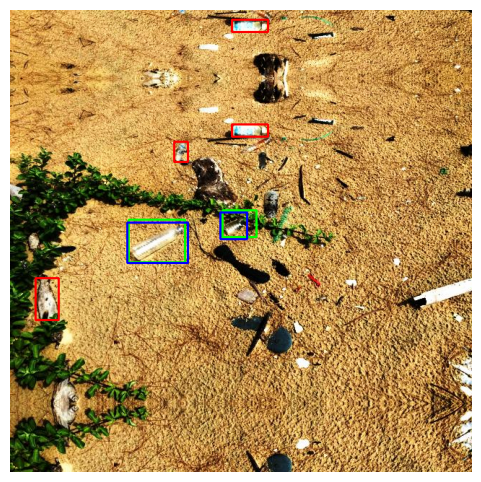

In [48]:
show_prediction(
    "IMG_7461_JPG_jpg.rf.94fbf147e90ce1d8f79193101d450924.jpg",
    "hr_yolo11n_test_predictions/baseline_yolo11n/labels",
    "dataset_hr/test/images",
    "dataset_hr/test/labels"
)

TP: 1, FP: 2, FN: 1


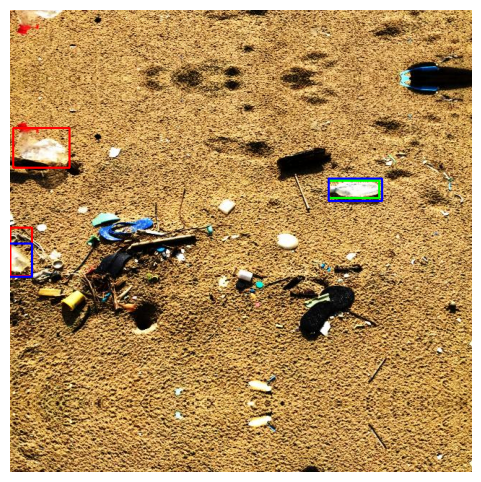

In [54]:
show_prediction(
    "IMG_7030_JPG_jpg.rf.510f0ea25c711ff63b6a071176e32ecb.jpg",
    "hr_yolo11n_test_predictions/baseline_yolo11n/labels",
    "dataset_hr/test/images",
    "dataset_hr/test/labels"
)

TP: 5, FP: 6, FN: 0


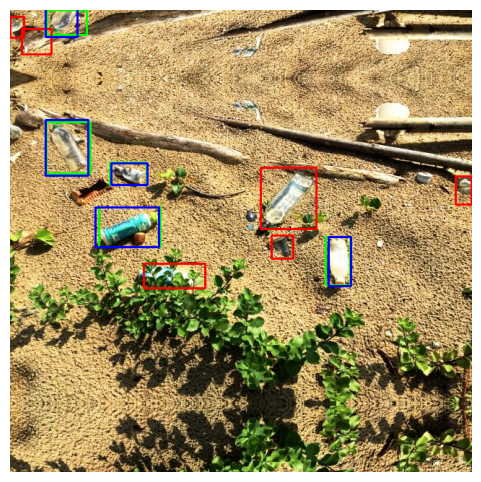

In [64]:
show_prediction(
    "IMG_7199_JPG_jpg.rf.f78d66acbdd414aa266c03bb9388b9b0.jpg",
    "hr_yolo11n_test_predictions/baseline_yolo11n/labels",
    "dataset_hr/test/images",
    "dataset_hr/test/labels"
)